<a href="https://colab.research.google.com/github/JLChoi/COVID-19/blob/master/COVID_19_StayAtHome.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**COVID-19 Awareness and Containment**
###**By: Jonathan Choi**
**PennKey: jonchoi, PennID: 64138399**

![alt text](https://higherlogicdownload.s3.amazonaws.com/NAAHP/f578995d-5ef1-4c11-b272-79d3fdf19620/UploadedImages/covid-19-1330px__1_.jpg)

For this project, I investigated trends on social media in response to the recent COVID-19 outbreak. Specifically, I attempted to analyze sentiments on Twitter in response to the pandemic. To achieve this, I used the Coronavirus COVID-19 Tweets dataset from Kaggle for the Twitter data and the New York Times' data about the number of COVID cases and deaths in the United States.

**Motivation:** For the past couple of months, the global health crisis caused by COVID-19 has escalated to unprecedented proportions. However, there was a lot of disagreement about how serious the situation truly was especially at the beginning of the outbreak. Many sources, from social media users to government officials, refused to acknowledge the severity of the situation by comparing the disease to the common flu and insisting that the situation would blow over in a matter of weeks. Clearly, this was not the case. Therefore, I aim to investigate what factors improved public awareness about the pandemic.

##**Set Up**
Here, I collected the relevant libraries and downloaded the smid80/coronavirus-covid19-tweets dataset from Kaggle. This dataset provided all Tweets relevant to the Coronavirus from the month of March in CSV format. Tweets were deemed relevant if they considered any COVID-19 specific hashtags, such as #coronavirus, #coronavirusoutbreak, #coronavirusPandemic, #covid19, and #covid_19.

The CSVs were separated by the day in March that the Tweets were made, and the data only ranged from March 9, 2020 to March 28, 2020.

In [ ]:
import numpy as np 
import pandas as pd 
import json
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from datetime import datetime
import glob
import seaborn as sns
import re
import os

from google.colab import files
#upload kaggle.json (API Key)
files.upload()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"jlchoi","key":"53a4f9e8766d17b2a812e50f0fed9495"}'}

Set up connection to Kaggle and download data.

In [ ]:
!ls -lha kaggle.json
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

-rw-r--r-- 1 root root 62 May  3 18:00 kaggle.json
ref                                                         title                                                size  lastUpdated          downloadCount  
----------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  
allen-institute-for-ai/CORD-19-research-challenge           COVID-19 Open Research Dataset Challenge (CORD-19)    2GB  2020-05-02 20:35:01          60678  
divyansh22/us-border-crossing-data                          US Border Crossing Data                               2MB  2020-04-19 09:38:10            710  
roche-data-science-coalition/uncover                        UNCOVER COVID-19 Challenge                          142MB  2020-04-29 22:47:23           6563  
baltacifatih/turkish-lira-banknote-dataset                  Turkish Lira Banknote Dataset                         3GB  2020-04-19 14:48:39             77  
doaaalsenani/

In [ ]:
!kaggle datasets download -d smid80/coronavirus-covid19-tweets

 99% 1.88G/1.90G [00:13<00:00, 125MB/s]
100% 1.90G/1.90G [00:13<00:00, 146MB/s]


In [ ]:
!unzip /content/coronavirus-covid19-tweets.zip

Archive:  /content/coronavirus-covid19-tweets.zip
  inflating: 2020-03-00 Coronavirus Tweets (pre 2020-03-12).CSV  
  inflating: 2020-03-12 Coronavirus Tweets.CSV  
  inflating: 2020-03-13 Coronavirus Tweets.CSV  
  inflating: 2020-03-14 Coronavirus Tweets.CSV  
  inflating: 2020-03-15 Coronavirus Tweets.CSV  
  inflating: 2020-03-16 Coronavirus Tweets.CSV  
  inflating: 2020-03-17 Coronavirus Tweets.CSV  
  inflating: 2020-03-18 Coronavirus Tweets.CSV  
  inflating: 2020-03-19 Coronavirus Tweets.CSV  
  inflating: 2020-03-20 Coronavirus Tweets.CSV  
  inflating: 2020-03-21 Coronavirus Tweets.CSV  
  inflating: 2020-03-22 Coronavirus Tweets.CSV  
  inflating: 2020-03-23 Coronavirus Tweets.CSV  
  inflating: 2020-03-24 Coronavirus Tweets.CSV  
  inflating: 2020-03-25 Coronavirus Tweets.CSV  
  inflating: 2020-03-26 Coronavirus Tweets.CSV  
  inflating: 2020-03-27 Coronavirus Tweets.CSV  
  inflating: 2020-03-28 Coronavirus Tweets.CSV  
  inflating: Countries.CSV           
  inflating: 

##**Twitter Data**



###**Data Collection**
Here, I read in the CSV files into Pandas dataframes. To avoid exceeding RAM capacity or timing out, I first read the CSVs into three separate dataframes; early (3/0\*/2020), mid (3/1\*/2020), and late (3/2\*/2020) March. 

I also excluded certain columns from the data, such as the ID of the post itself, the username of the post's owner, and details about the posts or users (what device was used to post, when the user created the account) which did not illuminate information about the impact or content of the Tweet. Instead, I collected data about the posts' contents, the location of the post, the number of interactions with the posts (favorites/retweets), and how many followers the user had. This step also helped me save RAM, while also helping to narrow down the parameters I could investigate.

The Twitter dataset also gave me a mapping of country codes (which the Tweets were associated with) to the names of the corresponding countries. I loaded this into 'countries_df' to help with visualization later.

In [ ]:
tweet_mid_files = [i for i in glob.glob('/content/2020-03-1* Coronavirus Tweets.CSV'.format('csv'))]
tweet_late_files = [i for i in glob.glob('/content/2020-03-2* Coronavirus Tweets.CSV'.format('csv'))]
sorted(tweet_mid_files)
sorted(tweet_late_files)

all_tweet_mid_dfs = list()
all_tweet_late_dfs = list()

for csv in tweet_mid_files:
  df = pd.read_csv(csv, usecols=['user_id', 'created_at', 'text', 'favourites_count', 'retweet_count', 'country_code', 'followers_count', 'verified', 'lang'])
  all_tweet_mid_dfs.append(df)

for csv in tweet_late_files:
  df = pd.read_csv(csv, usecols=['user_id', 'created_at', 'text', 'favourites_count', 'retweet_count', 'country_code', 'followers_count', 'verified', 'lang'])
  all_tweet_late_dfs.append(df)


tweet_early_df = pd.read_csv('2020-03-00 Coronavirus Tweets (pre 2020-03-12).CSV', usecols=['user_id', 'created_at', 'text', 'favourites_count', 'retweet_count', 'country_code', 'followers_count', 'verified', 'lang'])
tweet_mid_df = pd.concat(all_tweet_mid_dfs)
tweet_late_df = pd.concat(all_tweet_late_dfs)
countries_df = pd.read_csv('Countries.CSV').set_index('country_code')

tweet_early_df

,user_id,created_at,text,favourites_count,retweet_count,country_code,followers_count,verified,lang
0,133184048,2020-03-09T00:00:00Z,"HOY | 20H00\n@CataAndramuno, ministra de @Salu...",2295,5,NaN,527405,True,es
1,1186295022246752256,2020-03-09T00:00:00Z,石家庄的一个小孩。可惜啊！\n\n#冠状病毒爆发 #冠状病毒 #肺炎 #病毒 #武汉肺炎追踪...,1029,2,NaN,85,False,zh
2,977945240140173318,2020-03-09T00:00:00Z,During a health scare like the #CoronavirusOut...,20,0,NaN,1096,False,en
3,270009645,2020-03-09T00:00:14Z,@Twitter please update reporting to include fa...,2087,0,NaN,202,False,en
4,846210311631851520,2020-03-09T00:00:28Z,Germ Guardian Pluggable Air Purifier &amp; San...,3618,0,NaN,5777,False,en
...,...,...,...,...,...,...,...,...,...
463413,298561399,2020-03-11T23:59:57Z,A really important read. What we’re measuring ...,3445,5,NaN,2469,False,en
463414,299693451,2020-03-11T23:59:58Z,Los casos de COVID-19 se registran mayoritaria...,18590,4,NaN,794985,True,es
463415,235396056,2020-03-11T23:59:58Z,Folks upset at the public preparedness measure...,2121,0,NaN,386,False,en
463416,114914506,2020-03-11T23:59:58Z,Apa itu Virus Coronavirus (Covid-19)?\n\nSumbe...,3482,71,NaN,86817,True,in


Since the Twitter data contained Tweets from around the world, it was very important for me to be able to identify which country a tweet originated from. Therefore, I removed rows with no 'country_code' data using 'df.dropna()'. At this point, the dataframes became small enough for me to combine, so I concatenated all of the Twitter data from March into 'tweet_country_df'.

In [ ]:
tweet_country_df = pd.concat([tweet_early_df.dropna(), tweet_mid_df.dropna(), tweet_late_df.dropna()])
tweet_country_df['created_at'] = tweet_country_df['created_at'].apply(lambda x : pd.to_datetime(x))
tweet_country_df

,user_id,created_at,text,favourites_count,retweet_count,country_code,followers_count,verified,lang
6,903146494257233921,2020-03-09 00:00:38+00:00,Es increíble la incompetencia e irresponsabili...,12950,8,ES,6341,False,es
44,70527928,2020-03-09 00:04:45+00:00,#coronavirusuk #Coronavirusireland #Coronavid1...,2378,0,GB,298,False,und
46,70527928,2020-03-09 00:04:56+00:00,#coronavirusuk #Coronavirusireland #Coronavid1...,2378,0,GB,298,False,und
63,1207930603041153024,2020-03-09 00:06:24+00:00,"@Maggie_DeBlock : ""Geen disproportionele maatr...",162,0,BE,6,False,nl
74,1207930603041153024,2020-03-09 00:07:39+00:00,"@HLN_BE @Maggie_DeBlock : ""Geen disproportione...",162,0,BE,6,False,nl
...,...,...,...,...,...,...,...,...,...
582021,514378524,2020-03-28 23:59:54+00:00,#CoronaVirus #DiamDiRumah #StayAtHome #Dirumah...,44,0,ID,421,False,und
582026,32538235,2020-03-28 23:59:55+00:00,Rutgers NJMS medical students will graduate ea...,291,1,US,1927,False,en
582046,176138188,2020-03-28 23:59:58+00:00,Bütün günler cumartesi pazar...bi gram uyku yo...,9736,0,TR,6290,False,tr
582048,3244000895,2020-03-28 23:59:59+00:00,Aquí algunos bulos difundidos sobre el #COVID1...,656,0,ES,123,False,es


Here, I freed the dataframes containing the raw Twitter data, again to preserve RAM.

In [ ]:
del tweet_early_df
del tweet_mid_df
del tweet_late_df

To measure the number of COVID-19 related Tweets made per day in March in each country, I used the 'groupby()' to first group by the country the Tweet was made in, and then the date that the tweet was made. I used 'count()' to tally the number of tweets per such group.

In [ ]:
by_country_df = tweet_country_df['user_id'].groupby(by=[tweet_country_df['country_code'], tweet_country_df['created_at'].dt.day]).count()
by_country_df = by_country_df.to_frame().rename(columns={'user_id' : 'count'})
by_country_df

count
country_code created_at       
AD           10              1
             11              3
             12              1
             13             11
             14              6
...                        ...
ZW           24             19
             25             30
             26             32
             27             18
             28             10

[3474 rows x 1 columns]

Here, I extracted the mapping of 'country_code' to the name of the country from 'countries_df' and put it into a dict.

In [ ]:
countries_df = countries_df.reset_index().dropna().drop_duplicates('country_code').set_index('country_code')
countries_dict = countries_df.to_dict('index')
countries_dict

{'AD': {'country': 'Andorra'},
 'AE': {'country': 'United Arab Emirates'},
 'AF': {'country': 'Afghanistan'},
 'AG': {'country': 'Antigua and Barbuda'},
 'AL': {'country': 'Albania'},
 'AM': {'country': 'Armenia'},
 'AO': {'country': 'Angola'},
 'AQ': {'country': 'Antarctica'},
 'AR': {'country': 'Argentina'},
 'AS': {'country': 'American Samoa'},
 'AT': {'country': 'Austria'},
 'AU': {'country': 'Australia'},
 'AW': {'country': 'Aruba'},
 'AX': {'country': 'Aland Islands'},
 'AZ': {'country': 'Azerbaijan'},
 'BA': {'country': 'Bosnia and Herzegovina'},
 'BB': {'country': 'Barbados'},
 'BD': {'country': 'Bangladesh'},
 'BE': {'country': 'Belgium'},
 'BF': {'country': 'Burkina Faso'},
 'BG': {'country': 'Bulgaria'},
 'BH': {'country': 'Bahrain'},
 'BI': {'country': 'Burundi'},
 'BJ': {'country': 'Benin'},
 'BL': {'country': 'Saint Barthélemy'},
 'BM': {'country': 'Bermuda'},
 'BN': {'country': 'Brunei'},
 'BO': {'country': 'Bolivia'},
 'BQ': {'country': 'Bonaire, Sint Eustatius and Saba

I wanted to observe the days with peaks in Twitter activity, so I found the max number of Tweets made in each country on any day in March. I then found the countries with the 10 highest peaks in Twitter activity, and stored the 'country_code' of these countries in 'countries'.

In [ ]:
active_countries = by_country_df.groupby(by='country_code').max().rename(columns={'count' : 'max'})
active_countries = active_countries.nlargest(10, 'max')
countries = list(active_countries.index)

active_countries

,max
country_code,
US,18356
IN,5888
GB,4788
ES,3808
TR,3072
CA,2324
BR,1787
FR,1762
IT,1750


###**Data Visualization**
I then plotted the Twitter activity per day of each country in 'countries' using 'countries_dict' to label the plot with the appropriate country names.

> The results of this confirmed that countries where COVID-19 outbreaks were prominent (the USA, European countries, and India) had a lot of the highest COVID related Twitter activity. Of these, the number of Tweets made in the US dominated, probably mostly due to a higher concentration of Twitter users. 

> There was a huge peak in the number of Tweets in all the countries (especially the US) on March 13, the day that the US declared a national emergency in response to the outbreak of the disease.

> Spain initially had some of the most Twitter activity, before somewhat dying down, reflecting the early outbreak in Spain followed by a relatively quick recovery. Conversely, activity in India remained relatively low until around late March, when the number of new cases in India really started to spike. In fact, the highest amount of Twitter activity in India occurred on the 22nd, which was the day that India observed a 14-hour curfew and started to lock down areas of the country. This indicates that Twitter activity is affected most by developments of the pandemic in one's home country, rather than globally. 

> This could mean that awareness about the virus mostly follows an outbreak in one's native country, rather than in response to globally available information about the virus in general. Due to this, understanding about the need for preventative measures could come too late to truly prevent an outbreak in a country. It could also mean that the governments and the media within these countries are only highlighting the virus as a threat to the public once it is already too big a problem to ignore.

> Also notable is the fact that trends (peaks vs. valleys) in the amount of Twitter activity amongst these countries appear near-identical. This could either suggest that increased Twitter activity (especially in the US) incites more users to make posts in response, or that global developments directly cause increases in Twitter activity around the world (such as with the peak due to US declaring national emergency).

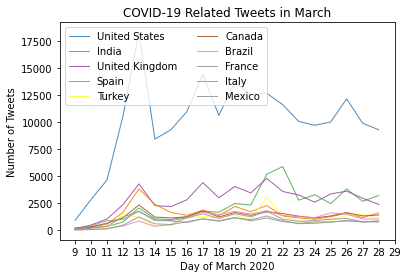

In [ ]:
palette = plt.get_cmap('Set1')
num = 0

reset_by_country = by_country_df.reset_index()

for country in countries:
  num += 1
  plt.plot('created_at', 'count', data=reset_by_country[reset_by_country['country_code'] == country], color=palette(num), linewidth=1, alpha=0.9, label=countries_dict[country]['country'])

plt.legend(loc=2, ncol=2)
plt.xlabel("Day of March 2020")
plt.ylabel("Number of Tweets")
plt.title("COVID-19 Related Tweets in March")
plt.xticks(range(9,30))

del reset_by_country

I decided to investigate the sentiments in the US in response to COVID-19 given that the US contributed the most Twitter data and that English text could more readily be analyzed. Thus, I separated out the Tweets made in the US into 'us_tweet_df'

In [ ]:
us_tweet_df = tweet_country_df[tweet_country_df['country_code'] == 'US']
us_tweet_df['text'] = us_tweet_df['text'].apply(lambda x : x.lower())
us_tweet_df

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,user_id,created_at,text,favourites_count,retweet_count,country_code,followers_count,verified,lang
75,3312730877,2020-03-09 00:07:42+00:00,@jameshamblin priorities baby!! 😱#coronaviruso...,9522,0,US,268,False,en
228,75375410,2020-03-09 00:27:46+00:00,@jeremykonyndyk @iluvmarthasvy @scottgottliebm...,3845,1,US,1123,False,en
354,40922465,2020-03-09 00:42:40+00:00,thank you @laurennews3lv for speaking with @pu...,29241,1,US,7598,False,en
390,22194848,2020-03-09 00:47:27+00:00,the other half of a shallow shell. #melaniaant...,4921,0,US,145,False,en
413,1229759196180230150,2020-03-09 00:50:08+00:00,oil prices tank to 1991 prices\n\n—— .96 cent ...,861,0,US,385,False,en
...,...,...,...,...,...,...,...,...,...
581921,74823921,2020-03-28 23:59:36+00:00,"life hack, first responders can use p95 masks ...",30733,0,US,438,False,en
581929,68405642,2020-03-28 23:59:37+00:00,that moose knuckle thou!🤣😷🧻🙄😭🔥🤪😎#covıd19 #soci...,2373,0,US,437,False,en
581966,14987099,2020-03-28 23:59:43+00:00,important outcome data from first 165 🇬🇧 icu d...,966,0,US,364,False,en
582026,32538235,2020-03-28 23:59:55+00:00,rutgers njms medical students will graduate ea...,291,1,US,1927,False,en


###**Sentiment Analysis**
To observe the sentiments in the US Tweets, I used the Natural Language Toolkit to tokenize the text in the Tweets. To get more informative results, I added custom stopwords to be filtered out, such as the hashtags found in all of these Tweets, as well as other words common words that were uninformative, such as "like."

In [ ]:
import nltk
from nltk import ngrams
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
from collections import Counter
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
tweet_tokenized = us_tweet_df['text'].apply(lambda x : word_tokenize(x))
tweet_tokens = []

for tweet in tweet_tokenized:
  for token in tweet:
    if token.isalpha():
      tweet_tokens.append(token)

#stop words to be filtered out. Include custom stop words including the hashtags used to find the Tweets, strings common in links, and uninformative but common words
stop_words = set(stopwords.words('english'))
stop_words = stop_words.union({'https', 'coronavirus', 'coronavirusoutbreak', 'coronavirususa', 'coronaviruspandemic', 
                               'like', 'de', 'go', 'going', 'know', 'us', 'people', 'amp'})

filtered_tokens = [token for token in tweet_tokens if all(sw != token for sw in stop_words)]

####**Buzz Words**
After tokenizing and filtering the Tweets, I put the most common words into a WordCloud to visualize the sentiments of the Tweets. 

> Notably, "trump" and "realdonaldtrump," President Trump's Twitter handle, were among the most popular words, indicating that the public very often looked towards the government's response to the pandemic for information. This also reflects the controversy that the President's responses to the pandemic often stirred up.

> Another interesting word was "work", which points to the increasing number of people forced to work from home, as well as growing concerns about the economy and unemployment in light of the shutdown and social distancing.

> "please", "stay", "home", "quarantine", and "social distancing" were also very popular, demonstrating that the public was spreading awareness about the disease and urging others to help prevent its spread.

> These results show that by March, the public was largely acknowledging the threat of the virus and attempting to spread awareness of the disease.


In [ ]:
tweet_token_dict = dict(Counter(filtered_tokens).most_common(30))
tweet_token_dict

{'cases': 5816,
 'day': 7304,
 'everyone': 4962,
 'get': 11641,
 'good': 4909,
 'health': 5287,
 'help': 7118,
 'home': 9584,
 'let': 4698,
 'make': 4596,
 'need': 9220,
 'new': 8687,
 'one': 7940,
 'pandemic': 8250,
 'please': 6823,
 'quarantine': 7887,
 'realdonaldtrump': 6683,
 'right': 5532,
 'see': 4704,
 'socialdistancing': 6987,
 'stay': 7481,
 'stayhome': 5419,
 'still': 5206,
 'take': 5249,
 'time': 10159,
 'today': 7295,
 'trump': 6961,
 'virus': 6175,
 'work': 6321,
 'would': 5176}

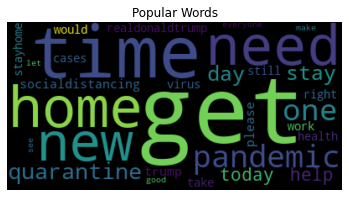

In [ ]:
from matplotlib import pylab as pl

wc = WordCloud()

tweet_wc = wc.fit_words(tweet_token_dict)
pl.imshow(tweet_wc, interpolation='bilinear')
pl.title(label='Popular Words')
pl.axis('off')
pl.show()

####**Phrases**
To further understand sentiments in the US towards COVID-19, I used Natural Language Tool Kit's ngrams to find popular two-to-three word phrases in the Tweets. I again used WordClouds to visualize the prominence of these phrases.

**Two word phrases**

> Popular two word phrases included "los angeles" and "new york", where major outbreaks in the US occurred, as well as "confirmed cases", indicating that the public was highly concerned about the spread of the disease.

> "social distancing", "stay home", "stay safe", and "wash hands" again indicated a large amount of people encouraging others to adopt preventative practices.

> Again, "working home" was a popular choice, demonstrating the large number of companies that had their employees work from home.

> "press conference" appeared as well, supporting the hypothesis that many turned to the government for information about the virus.

> All in all, this data again supports that, after the outbreak, there was a high amount of awareness in the US about the disease, and not a lot of disagreement over it's severity.

**Three word phrases**
> The majority of the popular three word phrases expressed support for Italy, which was particularly hard-hit by COVID-19. This supports the claim that global events related to COVID-19 did affect Twitter activity amd public awareness around the world.

In [ ]:
twograms = []
threegrams = []

for tweet in tweet_tokenized:
  tweet = [token for token in tweet if token.isalpha() and all(sw != token for sw in stop_words)]
  twograms += [(word1 + " " + word2) for word1, word2 in ngrams(tweet, 2)]
  threegrams += [(word1 + " " + word2 + " " + word3) for word1, word2, word3 in ngrams(tweet, 3)]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: generator 'ngrams' raised StopIteration
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: generator 'ngrams' raised StopIteration
  import sys


In [ ]:
twograms_dict = dict(Counter(twograms).most_common(20))
threegrams_dict = dict(Counter(threegrams).most_common(10))
threegrams_dict

{'amici siamo con': 440,
 'cari amici siamo': 440,
 'colleagues friends family': 434,
 'con voi westandwithitaly': 439,
 'italian friends colleagues': 432,
 'italy trying times': 432,
 'share support italian': 432,
 'siamo con voi': 441,
 'stand italy trying': 432,
 'support italian friends': 432}

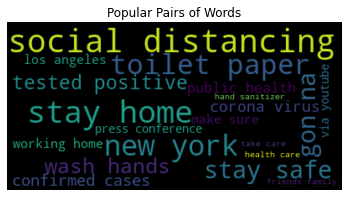

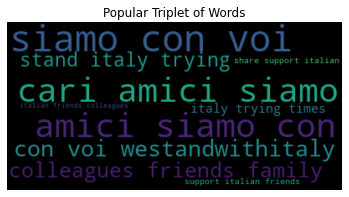

In [ ]:
twograms_wc = wc.fit_words(twograms_dict)
pl.imshow(twograms_wc, interpolation='bilinear')
pl.title(label='Popular Pairs of Words')
pl.axis('off')
pl.show()

threegrams_wc = wc.fit_words(threegrams_dict)
pl.imshow(threegrams_wc, interpolation='bilinear')
pl.title(label='Popular Triplet of Words')
pl.axis('off')
pl.show()

##**COVID-19 Data**
To correlate the trends in Twitter activity in the US to the spread of the disease, I retrieved the New York Times' data on the number of cases and deaths in the US per date.

###**Data Collection**

In [ ]:
#upload df_us_nyt.csv
files.upload()

Saving df_us_nyt.csv to df_us_nyt.csv


{'df_us_nyt.csv': b"date,fips,day,county,state,sub_region,region,lat,long,cases,deaths\n2020-01-21,53061,0,Snohomish,Washington,pacific,west,48.04615983,-121.7170703,1,0\n2020-01-22,53061,1,Snohomish,Washington,pacific,west,48.04615983,-121.7170703,1,0\n2020-01-23,53061,2,Snohomish,Washington,pacific,west,48.04615983,-121.7170703,1,0\n2020-01-24,17031,3,Cook,Illinois,east_north_central,midwest,41.84144849,-87.81658794,1,0\n2020-01-24,53061,3,Snohomish,Washington,pacific,west,48.04615983,-121.7170703,1,0\n2020-01-25,6059,4,Orange,California,pacific,west,33.70147516,-117.7645998,1,0\n2020-01-25,17031,4,Cook,Illinois,east_north_central,midwest,41.84144849,-87.81658794,1,0\n2020-01-25,53061,4,Snohomish,Washington,pacific,west,48.04615983,-121.7170703,1,0\n2020-01-26,4013,5,Maricopa,Arizona,mountain,west,33.34835867,-112.4918154,1,0\n2020-01-26,6037,5,Los Angeles,California,pacific,west,34.30828379,-118.2282411,1,0\n2020-01-26,6059,5,Orange,California,pacific,west,33.70147516,-117.7645998,1

In [ ]:
nyt_df = pd.read_csv('/content/df_us_nyt.csv', usecols=['date', 'state', 'cases', 'deaths'])
nyt_df['date'] = nyt_df['date'].apply(lambda x : pd.to_datetime(x))

nyt_df

,date,state,cases,deaths
0,2020-01-21,Washington,1,0
1,2020-01-22,Washington,1,0
2,2020-01-23,Washington,1,0
3,2020-01-24,Illinois,1,0
4,2020-01-24,Washington,1,0
...,...,...,...,...
102721,2020-04-30,Wyoming,1,0
102722,2020-04-30,Wyoming,11,0
102723,2020-04-30,Wyoming,65,1
102724,2020-04-30,Wyoming,6,0


###**Data Wrangling**
The NYT data had separate figures for each state on each date, which the Twitter data did not have. Therefore, I grouped the NYT data by date and summed the number of cases reported in each state on that date to get the cumulative number of COVID-19 cases and deaths in the US over time.

In [ ]:
cases_df = nyt_df.groupby('date').sum()
cases_df

,cases,deaths
date,,
2020-01-21,1,0
2020-01-22,1,0
2020-01-23,1,0
2020-01-24,2,0
2020-01-25,3,0
...,...,...
2020-04-26,798364,37456
2020-04-27,818827,38624
2020-04-28,842209,40607


I thought important features in the data might be the number of new cases and deaths per day, for which I used 'diff()', as well as the percent change in the number of new cases or deaths per day. This would allow me to observe the impact of each day on the number of COVID-19 cases to see if this corresponded to a change in Twitter activity.

Since I was only provided Twitter data from March, I also extracted only the COVID-19 data from March. Then, to allow better comparison with the COVID-19 data, I found the percent change in the number of Tweets per day as well.

In [ ]:
cases_df = cases_df[cases_df.index.month == 3]
cases_df['cases_diff'] = cases_df['cases'].diff()
cases_df['deaths_diff'] = cases_df['deaths'].diff()
cases_df['cases_change'] = cases_df['cases_diff'].pct_change()
cases_df['deaths_change'] = cases_df['deaths_diff'].pct_change()
cases_df

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

,cases,deaths,cases_diff,deaths_diff,cases_change,deaths_change
date,,,,,,
2020-03-01,85,3,NaN,NaN,NaN,NaN
2020-03-02,101,6,16.0,3.0,NaN,NaN
2020-03-03,121,10,20.0,4.0,0.250000,0.333333
2020-03-04,157,12,36.0,2.0,0.800000,-0.500000
2020-03-05,222,12,65.0,0.0,0.805556,-1.000000
2020-03-06,303,15,81.0,3.0,0.246154,inf
2020-03-07,413,19,110.0,4.0,0.358025,0.333333
2020-03-08,530,22,117.0,3.0,0.063636,-0.250000
2020-03-09,725,26,195.0,4.0,0.666667,0.333333


Visualization of COVID-19 US data, demonstrating the increasing number of new cases in the US in March

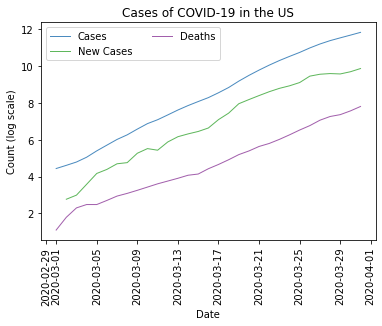

In [ ]:
#plot the number of cases (cumulative), the number of new cases, and the number of deaths on log scale
plt.plot(cases_df.index, np.log(cases_df['cases']), color=palette(1), linewidth=1, alpha=0.9, label="Cases")
plt.plot(cases_df.index, np.log(cases_df['cases_diff']), color=palette(2), linewidth=1, alpha=0.9, label="New Cases")
plt.plot(cases_df.index, np.log(cases_df['deaths']), color=palette(3), linewidth=1, alpha=0.9, label="Deaths")

plt.legend(loc=2, ncol=2)
plt.xlabel("Date")
plt.ylabel("Count (log scale)")
plt.title("Cases of COVID-19 in the US")
plt.xticks(rotation=90)
plt.show()

In [ ]:
#find the percent change in Twitter activity in the US
us_activity = us_tweet_df.groupby(us_tweet_df['created_at'].dt.date).count()

us_activity = us_activity.drop(columns=['created_at', 'text', 'favourites_count', 'retweet_count', 'country_code', 'followers_count', 'verified', 'lang']).rename(columns={'user_id' : 'tweet_count'})
us_activity['tweet_change'] = us_activity['tweet_count'].pct_change()
us_activity

,tweet_count,tweet_change
created_at,,
2020-03-09,883,NaN
2020-03-10,2816,2.189128
2020-03-11,4640,0.647727
2020-03-12,10561,1.276078
2020-03-13,18356,0.738093
2020-03-14,8437,-0.540368
2020-03-15,9307,0.103117
2020-03-16,10983,0.180080
2020-03-17,14432,0.314031


Since I had learned that StayAtHome Tweets were popular in reaction to increasing COVID-19 cases from the **Sentiment Analysis**, I also extracted the Tweets that contained "Stay at Home" in their text, and found the percent change in the number of such Tweets made per day.

Then, to compare this Twitter data with the number of COVID-19 cases and deaths, I merged the two dataframes on the date the data was generated.

In [ ]:
#list of keywords that would be contained in a #StayAtHome Tweet. Words could be space-separated in text, or combined in a hashtag
keywords = ['stay at home', 'stay home', 'stayathome', 'stayhome']
stay_home_tweet_df = us_tweet_df[us_tweet_df.stack().str.contains('|'.join(keywords)).any(level=0)]
stay_home_tweet_df

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


,user_id,created_at,text,favourites_count,retweet_count,country_code,followers_count,verified,lang
413,1229759196180230150,2020-03-09 00:50:08+00:00,oil prices tank to 1991 prices\n\n—— .96 cent ...,861,0,US,385,False,en
421,18944403,2020-03-09 00:50:51+00:00,.@drjodyrich is my colleague @brownuniversity....,27825,0,US,7462,True,en
1401,2908677620,2020-03-09 02:09:57+00:00,fear monger #internationalwomensday #seductive...,76657,1,US,6161,False,en
2390,1157571194,2020-03-09 03:11:24+00:00,right here is what is wrong with people &amp; ...,1748,0,US,175,False,en
5425,48446352,2020-03-09 05:35:07+00:00,had the #chinesegovernment focused on #covid20...,2895,1,US,796,False,en
...,...,...,...,...,...,...,...,...,...
579843,2379182562,2020-03-28 23:53:05+00:00,remember when fake news @msnbc did 24 coverage...,1111,1,US,1879,False,en
580774,729148541139091456,2020-03-28 23:55:53+00:00,every time i hear celebrity scum tell me to st...,661,0,US,50,False,en
580810,1166129042493509633,2020-03-28 23:56:00+00:00,my man is the cutest he had ordered food for t...,812,0,US,52,False,en
581683,1203891394160541697,2020-03-28 23:58:51+00:00,what y’all know about that booty pop??\n\nrona...,28,2,US,20,False,en


In [ ]:
stay_home_df = stay_home_tweet_df.groupby(stay_home_tweet_df['created_at'].dt.date).count()
stay_home_df = stay_home_df.drop(columns=['created_at', 'text', 'favourites_count', 'retweet_count', 'country_code', 'followers_count', 'verified', 'lang']).rename(columns={'user_id' : 'stay_home_count'})
stay_home_df['stay_home_change'] = stay_home_df['stay_home_count'].pct_change()
stay_home_df

,stay_home_count,stay_home_change
created_at,,
2020-03-09,35,NaN
2020-03-10,70,1.000000
2020-03-11,99,0.414286
2020-03-12,295,1.979798
2020-03-13,405,0.372881
2020-03-14,222,-0.451852
2020-03-15,480,1.162162
2020-03-16,559,0.164583
2020-03-17,1058,0.892665


In [ ]:
#merging Twitter and COVID-19 data
us_activity.index = pd.to_datetime(us_activity.index)
merged_cases_tweets = cases_df.merge(right=us_activity, left_index=True, right_index=True).merge(right=stay_home_df, left_index=True, right_index=True)

merged_cases_tweets

,cases,deaths,cases_diff,deaths_diff,cases_change,deaths_change,tweet_count,tweet_change,stay_home_count,stay_home_change
2020-03-09,725,26,195.0,4.0,0.666667,0.333333,883,NaN,35,NaN
2020-03-10,976,31,251.0,5.0,0.287179,0.250000,2816,2.189128,70,1.000000
2020-03-11,1206,37,230.0,6.0,-0.083665,0.200000,4640,0.647727,99,0.414286
2020-03-12,1566,43,360.0,6.0,0.565217,0.000000,10561,1.276078,295,1.979798
2020-03-13,2045,50,479.0,7.0,0.330556,0.166667,18356,0.738093,405,0.372881
2020-03-14,2603,59,558.0,9.0,0.164927,0.285714,8437,-0.540368,222,-0.451852
2020-03-15,3240,63,637.0,4.0,0.141577,-0.555556,9307,0.103117,480,1.162162
2020-03-16,4009,84,769.0,21.0,0.207221,4.250000,10983,0.180080,559,0.164583
2020-03-17,5222,106,1213.0,22.0,0.577373,0.047619,14432,0.314031,1058,0.892665
2020-03-18,6947,137,1725.0,31.0,0.422094,0.409091,10627,-0.263650,653,-0.382798


###**Data Visualization**

I then created two plots:

**Plot 1**
> In the first plot, I compared the number of new cases per day, the number of Tweets per day, and the number of StayAtHome Tweets per day.

> We see that the number of new cases per day pretty much monotonically increased throughout March. However, the same was not true of the number of COVID-19 related Tweets, which had a peaks and valleys influenced by other events (such as the surge of Tweets due to the declearation of national emergency). The number of StayAtHome Tweets though, generally continued to increase throughout March.

**Plot 2**
> In the second plot, I compared the percent change in the number of new cases per day, the number of new Tweets per day, and the number of StayAtHome Tweets per day.

> This plot demonstrated a much stronger correlation, between then Twitter activity and changes in the number of new cases reported.

> The percent change in the number of Tweets over time oscillated down to around a constant number of Tweets per day towards late May, indicating the passing of hysteria. However, a spike in the number of new cases on March 26 prompted spikes in Twitter activity, demonstrating the correlation.

> What was interesting was that the change in the number of StayAtHome Tweets seemed much more sensitive than the change in the number of Tweets in general. This demonstrates that a large increase in new cases in the US prompted a short-lived wave of posts urging others to practice social distancing.

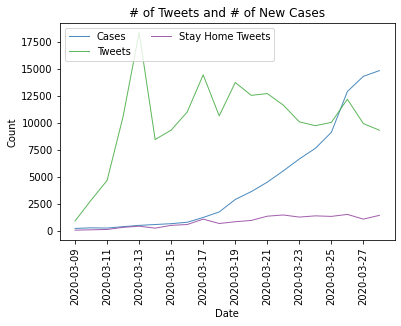

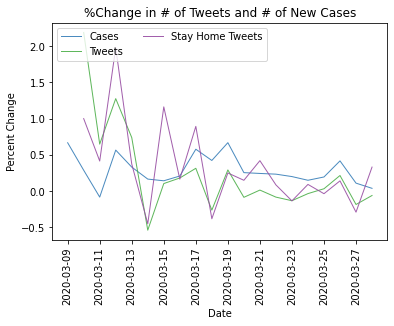

In [ ]:
plt.plot(merged_cases_tweets.index, 'cases_diff', data=merged_cases_tweets, color=palette(1), linewidth=1, alpha=0.9, label="New Cases")
plt.plot(merged_cases_tweets.index, 'tweet_count', data=merged_cases_tweets, color=palette(2), linewidth=1, alpha=0.9, label="Tweets")
plt.plot(merged_cases_tweets.index, 'stay_home_count', data=merged_cases_tweets, color=palette(3), linewidth=1, alpha=0.9, label="Stay Home Tweets")

plt.legend(loc=2, ncol=2)
plt.xlabel("Date")
plt.ylabel("Count")
plt.title("# of Tweets and # of New Cases")
plt.xticks(rotation=90)
plt.show()

plt.plot(merged_cases_tweets.index, 'cases_change', data=merged_cases_tweets, color=palette(1), linewidth=1, alpha=0.9, label="New Cases")
plt.plot(merged_cases_tweets.index, 'tweet_change', data=merged_cases_tweets, color=palette(2), linewidth=1, alpha=0.9, label="Tweets")
plt.plot(merged_cases_tweets.index, 'stay_home_change', data=merged_cases_tweets, color=palette(3), linewidth=1, alpha=0.9, label="Stay Home Tweets")


plt.legend(loc=2, ncol=2)
plt.xlabel("Date")
plt.ylabel("Percent Change")
plt.title("%Change in # of Tweets and # of New Cases")
plt.xticks(rotation=90)
plt.show()

##**Models**
I then attempted to model the some of the relationships between COVID-19 related Twitter activity and current events to identify the largest contributing factors to Twitter activity.

To do this, I used the Sci-Kit Learn library.

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

###**Favorites**
To test some of the hypothesis discovered in **Sentiment Analysis**, I used a Linear Regression on what factors resulted in the most amount of "Favorites" on a given Tweet in the US. A "Favorite" is Twitter's version of a "Like," so I likened the number of "Favorites" a Tweet has to its popularity.

Thus, the number of "Favorites" on a post was the label, and for features, I chose factors that often affect the number of favorites a post receives:

*   The day in March that the post was made (current events)
*   The number of Retweets the post received (the reach of the post)
*   The number of Followers the Poster has (the reach of the post)
*   Whether the Poster is verified (the reach and integrity of the post)
*   Whether the post contains a mention to President Trump (from **Sentiment Analysis**)
*   Whether the post contains a mention to #StayAtHome (from **Sentiment Analysis**)

I chose to use a Linear Regression because I anticipated a linear relationship between the number of "Favorites" a post gets and the popularity of the poster, as well as whether or not it mentions certain trending terms.

First, I log-scaled the number of favorites on a post, the number of retweets on a post, and the number of followers the user had to normalize the data.

I then split the data into training and testing sets using train_test_split with 80% used for training and 20% used for testing.

In [ ]:
favorites_data = us_tweet_df[['created_at', 'text', 'favourites_count', 'retweet_count', 'followers_count', 'verified']]
favorites_data['day'] = favorites_data['created_at'].dt.day
favorites_data['contains_trump'] = favorites_data['text'].apply(lambda x : 'trump' in x)
favorites_data['stay_at_home'] = favorites_data['text'].apply(lambda x : any(word in x for word in keywords))
favorites_data['favorites_log'] = np.log(favorites_data['favourites_count'].apply(lambda x : x + 1))
favorites_data['followers_log'] = np.log(favorites_data['followers_count'].apply(lambda x : x + 1))
favorites_data['retweets_log'] = np.log(favorites_data['retweet_count'].apply(lambda x : x + 1))
favorites_data.drop(columns=['created_at', 'text', 'favourites_count', 'followers_count', 'retweet_count'], inplace=True)
favorites_data

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,verified,day,contains_trump,stay_at_home,favorites_log,followers_log,retweets_log
75,False,9,False,False,9.161465,5.594711,0.000000
228,False,9,False,False,8.254789,7.024649,0.693147
354,False,9,False,False,10.283361,8.935772,0.693147
390,False,9,True,False,8.501470,4.983607,0.000000
413,False,9,False,False,6.759255,5.955837,0.000000
...,...,...,...,...,...,...,...
581921,False,28,False,False,10.333125,6.084499,0.000000
581929,False,28,False,False,7.772332,6.082219,0.000000
581966,False,28,False,False,6.874198,5.899897,0.000000
582026,False,28,False,False,5.676754,7.564238,0.693147


In [ ]:
tweet_label = favorites_data['favorites_log']
tweet_features = favorites_data.drop(columns=['favorites_log'])

In [ ]:
tweet_x_train, tweet_x_test, tweet_y_train, tweet_y_test = train_test_split(tweet_features, tweet_label, test_size=0.2)

After fitting the Linear Regression model on the data, the model had a RMSE of about 1.75, reflecting a fairly accurate fit to the data given the very wide range in the number of "Favorites" received, even in log-scale.

Printing the coefficients, I got the following results:

> The largest contributing factor was unsurprisingly the number of followers the post's owner had, which directly influenced the number of people that saw the post.

> Interestingly, the next largest contributing factor was whether the post mentioned President Trump or not. This supports the hypothesis that the public sentiment towards the COVID-19 was largely influenced by the government's actions.

> Meanwhile, mentions of #StayAtHome actually had a slightly negative weighting, indicating that, while a large number of such posts were spurred on by the outbreak, they did not command much popularity. Instead, criticizing or praising the President's controversial response to the disease gained much more support.

In [ ]:
lr = LinearRegression()
lr.fit(tweet_x_train, tweet_y_train)

y_pred = lr.predict(tweet_x_test)

print(lr.coef_)

[-0.89157779 -0.01406589  0.54506283 -0.0956748   0.65994394 -0.15999917]


In [ ]:
mse_train = mean_squared_error(tweet_y_train, lr.predict(tweet_x_train))
mse_test = mean_squared_error(tweet_y_test, y_pred)
print(np.sqrt(mse_train), np.sqrt(mse_test))

1.7520968355844386 1.75308216829528


###**COVID-19 Cases on Tweets**
Next, I attempted to model the effect that changes in the Coronavirus pandemic had on the number of Tweets that were posted. To do this, I took two approaches; looking at the day to day relationship, as well as the relationship over time. For both approaches, I chose to use a RandomForestRegression because the features I selected (different measures of changes in COVID-19 cases) were all heavily related to one another.

***Disclaimer:*** Because the Twitter data was limited to just the month of March, I only had about 20 datapoints to model on, so the models have very low consistency - results are heavily skewed based on the splits used. However, the concept behind these models seemed valuable, and with more data and diverse features, these models could be much more informative.

First, I collected the data from the merged dataframe of both the COVID-19 case data and the Twitter data. Then, I log-scaled the cumulative number of cases, deaths, new cases, and new deaths for each day.

In [ ]:
model_data = merged_cases_tweets
model_data['cases_log'] = np.log(model_data['cases'])
model_data['deaths_log'] = np.log(model_data['deaths'])
model_data['cases_diff_log'] = np.log(model_data['cases_diff'])
model_data['deaths_diff_log'] = np.log(model_data['deaths_diff'])
model_data

,cases,deaths,cases_diff,deaths_diff,cases_change,deaths_change,tweet_count,tweet_change,stay_home_count,stay_home_change,cases_log,deaths_log,cases_diff_log,deaths_diff_log
2020-03-09,725,26,195.0,4.0,0.666667,0.333333,883,NaN,35,NaN,6.586172,3.258097,5.273000,1.386294
2020-03-10,976,31,251.0,5.0,0.287179,0.250000,2816,2.189128,70,1.000000,6.883463,3.433987,5.525453,1.609438
2020-03-11,1206,37,230.0,6.0,-0.083665,0.200000,4640,0.647727,99,0.414286,7.095064,3.610918,5.438079,1.791759
2020-03-12,1566,43,360.0,6.0,0.565217,0.000000,10561,1.276078,295,1.979798,7.356280,3.761200,5.886104,1.791759
2020-03-13,2045,50,479.0,7.0,0.330556,0.166667,18356,0.738093,405,0.372881,7.623153,3.912023,6.171701,1.945910
2020-03-14,2603,59,558.0,9.0,0.164927,0.285714,8437,-0.540368,222,-0.451852,7.864420,4.077537,6.324359,2.197225
2020-03-15,3240,63,637.0,4.0,0.141577,-0.555556,9307,0.103117,480,1.162162,8.083329,4.143135,6.456770,1.386294
2020-03-16,4009,84,769.0,21.0,0.207221,4.250000,10983,0.180080,559,0.164583,8.296297,4.430817,6.645091,3.044522
2020-03-17,5222,106,1213.0,22.0,0.577373,0.047619,14432,0.314031,1058,0.892665,8.560636,4.663439,7.100852,3.091042
2020-03-18,6947,137,1725.0,31.0,0.422094,0.409091,10627,-0.263650,653,-0.382798,8.846065,4.919981,7.452982,3.433987


####**Day-to-Day**

Here, I investigated whether the change in the number of COVID-19 cases or deaths in the US would directly impact the number of Tweets made on that day.

For the label, I used the log-scaled number of Tweets made on each day.

For the features:
*   Log-scaled cumulative number of cases (breaking-point/milestone)
*   Log-scaled cumulative number of deaths (breaking-point/milestone)
*   Log-scaled number of new cases
*   Log-scaled number of new deaths
*   Percent change in the number of new cases (drastic change in the number of new cases)
*   Percent change in the number of new deaths (drastic change in the number of new deaths)

I again used train_test_split(test_size=0.2) to get the training and test data, and used GridSearchCV to find the optimal parameters for the RandomForestRegressor: max_depth=50, n_estimators=50.

**Results:**
The RandomForestRegressor found that the percent change in the number of deaths was the least significant factor. The rest of the factors had similar weights, with the cumulative number of cases and the percent change in the number of cases being the most important.

The RMSE on the test data was about 0.16, which was actually pretty low considering that, towards the end of March, the log-scaled number of Tweets per day stabilized to within a range of 0.4.

In [ ]:
label = np.log(model_data['tweet_count'])
features = model_data[['cases_log', 'cases_diff_log', 'cases_change', 'deaths_log', 'deaths_diff_log', 'deaths_change']]

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=0.2)

In [ ]:
rf = RandomForestRegressor()

param_grid = {
    'max_depth': [5, 10, 50, 100],
    'n_estimators': [5, 10, 50, 100]
}

gs_csv = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
gs_csv.fit(x_train, y_train)

print(gs_csv.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


{'max_depth': 50, 'n_estimators': 50}


[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:    2.2s finished


In [ ]:
rfr = RandomForestRegressor(max_depth=50, n_estimators=50)
rfr.fit(x_train, y_train)

y_pred = rfr.predict(x_test)
print(rfr.feature_importances_)

[0.24733008 0.18095079 0.13043217 0.19787926 0.2181408  0.0252669 ]


In [ ]:
mse_train = mean_squared_error(y_train, rfr.predict(x_train))
mse_test = mean_squared_error(y_test, y_pred)
print(np.sqrt(mse_train), np.sqrt(mse_test))

0.20558810405430428 0.16429068297250524


####**Over Time**
To investigate the correlation between the COVID-19 data and the amount of Tweets posted over time, I used the TimeSeriesSplit to train the RandomForestRegressor. Given that my data did not have a large range in time, I only had 5 splits for the TimeSeriesSplit.

The labels and features for the model remained the same, as well as the parameters: max_depth=100, n_estimators=50.

**Results:** The RMSE for the test data acorss all the splits were around 0.43, which is relatively high. The earlier splits indicated that the cumulative number of cases and deaths and the percent change in the number of deaths were more heavily weighted. Over time, however, the cumulative number of cases and deaths, and the number of new cases per day became the most weighted factors, with the percent change in the number of deaths becoming one of the least weighted. This reflects the shift in sentiment that may have occurred as the public increasingly learned that the disease was not extremely deadly but highly infectious and "flattening the curve" became the highest priority.

In [ ]:
time_x_train = features[:int(features.shape[0]*0.8)].reset_index(drop=True)
time_x_test = features[int(features.shape[0]*0.8):].reset_index(drop=True)
time_y_train = pd.DataFrame(label[:int(label.shape[0]*0.8)].reset_index(drop=True))
time_y_test = pd.DataFrame(label[int(label.shape[0]*0.8):].reset_index(drop=True))

In [ ]:
tscv = TimeSeriesSplit(n_splits=5)
i = 1
score = []
for tr_index, val_index in tscv.split(time_x_train):
    x_tr, x_val = time_x_train.loc[tr_index, :], time_x_train.loc[val_index, :]
    y_tr, y_val = time_y_train.loc[tr_index, :], time_y_train.loc[val_index, :]
    
    rfr = RandomForestRegressor(max_depth=50, n_estimators=50)
    rfr.fit(x_tr, y_tr)
    y_pred = rfr.predict(x_test)
    rmse_train = np.sqrt(mean_squared_error(y_tr, rfr.predict(x_tr)))
    rmse_test = np.sqrt(mean_squared_error(time_y_test, y_pred))
    score.append({'split': i, 'score': rfr.score(x_test, y_test), 'importances': rfr.feature_importances_, 'rmse_train': rmse_train, 'rmse_test': rmse_test})
    i += 1

print(score)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if __name__ == '__main__':


[{'split': 1, 'score': 0.6136870413599058, 'importances': array([0.20797785, 0.11657671, 0.114639  , 0.22966345, 0.1263916 ,
       0.2047514 ]), 'rmse_train': 0.20037437159820096, 'rmse_test': 0.49941778520593905}, {'split': 2, 'score': 0.9546261542633632, 'importances': array([0.25532537, 0.21211905, 0.15516449, 0.29518093, 0.0646896 ,
       0.01752056]), 'rmse_train': 0.2103056223593716, 'rmse_test': 0.35941764815022303}, {'split': 3, 'score': 0.9921040414746539, 'importances': array([0.2584316 , 0.24724093, 0.19848861, 0.18322417, 0.04833371,
       0.06428098]), 'rmse_train': 0.27995025254930267, 'rmse_test': 0.4076743241335702}, {'split': 4, 'score': 0.967650943115673, 'importances': array([0.37981447, 0.26570252, 0.13463366, 0.16221406, 0.03818492,
       0.01945037]), 'rmse_train': 0.23310620162568696, 'rmse_test': 0.43267821476322}, {'split': 5, 'score': 0.89991913396395, 'importances': array([0.32839069, 0.20247866, 0.12976902, 0.22862806, 0.09143095,
       0.01930262]), 'r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if __name__ == '__main__':


##**Conclusion**

Through this project, I was able to identify the potential factors that contribute to awareness about COVID-19, as well as sentiments towards the situation. 

First, I observed that citizens are mainly focused on the well-being of their own country, with increased hysteria only once their government took major action. However, citizens are keeping a close eye on the responses of other afflicted countries to judge the severity of the situation. The concern here is that citizens will not often take pre-emptive preventative measures, and mostly react after an outbreak has occurred. For future situations, quickly convincing the public of a new disease's severity will be paramount to preventing another pandemic.

I believe the biggest takeaway is the extent to which the public sentiment in a country was heavily swayed by the response of their native government to the pandemic. In the US in particular, President Trump's response to the disease was heavily surveyed and judged by the public. The government holds an enormous responsibility in preventing panic but promoting awareness and ensuring safety. Further, in the US, over time the public's hysteria died down and concern shifted from the disease's lethality to its infectivity. In fact, the focus fell largely upon the number of new cases reported, with awareness-raising posts growing more frequent whenever there was a significant increase in the number of new cases.